In [140]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
import xgboost
from xgboost import XGBClassifier
from matplotlib.pyplot import figure
%matplotlib inline

## Cargando el dataset 

In [98]:
diabetes_df = pd.read_csv('diabetic_data.csv')

In [99]:
diabetes_df.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


# Perfilamiento de datos para ver cuantas variables hay, que valores tiene cada variable y un primer análisis exploratorio

In [12]:
pandas_profiling.ProfileReport(diabetes_df)


In [100]:
diabetes_df.shape

(101766, 50)

In [101]:
diabetes_df.dtypes

encounter_id                 int64
patient_nbr                  int64
race                        object
gender                      object
age                         object
weight                      object
admission_type_id            int64
discharge_disposition_id     int64
admission_source_id          int64
time_in_hospital             int64
payer_code                  object
medical_specialty           object
num_lab_procedures           int64
num_procedures               int64
num_medications              int64
number_outpatient            int64
number_emergency             int64
number_inpatient             int64
diag_1                      object
diag_2                      object
diag_3                      object
number_diagnoses             int64
max_glu_serum               object
A1Cresult                   object
metformin                   object
repaglinide                 object
nateglinide                 object
chlorpropamide              object
glimepiride         

## Preprocesamiento de datos

In [102]:
to_drop = ['encounter_id','admission_type_id','discharge_disposition_id','admission_source_id',
           'patient_nbr', 'weight','payer_code','medical_specialty','tolazamide', 
           'acetohexamide', 'troglitazone', 'examide', 'citoglipton', 'glimepiride-pioglitazone', 
           'glipizide-metformin', 'metformin-rosiglitazone', 'metformin-pioglitazone', 'tolbutamide']

In [103]:
for column in to_drop:
    diabetes_df.drop([column], axis = 1, inplace=True)

In [104]:
diabetes_df.race.unique()

array(['Caucasian', 'AfricanAmerican', '?', 'Other', 'Asian', 'Hispanic'],
      dtype=object)

In [105]:
diabetes_df.gender.unique()

array(['Female', 'Male', 'Unknown/Invalid'], dtype=object)

In [106]:
# reemplazando los valores "?" por valores nulos en la variable race
# y los valores "unknown" por valores nulos
diabetes_df.replace({
                'race': {
                    '?': np.nan
            }
        }, inplace=True)

diabetes_df.replace({
                'gender': {
                    'Unknown/Invalid': np.nan
            }
        }, inplace=True)

In [107]:
# reemplazando valores nulos en ambas variables, teniendo en cuenta la moda

diabetes_df['race'].fillna(diabetes_df['race'].mode()[0], 
                                                 inplace=True)

diabetes_df['gender'].fillna(diabetes_df['gender'].mode()[0], 
                                                 inplace=True)

In [108]:
# haciendo one hot encoding en la variable race 
dummies = pd.get_dummies(diabetes_df['race'])
diabetes_df = pd.concat([diabetes_df, dummies], axis=1)  
diabetes_df.drop(['race'],  axis=1, inplace=True)

In [109]:
# haciendo label encoding en la variable gender

diabetes_df.replace({
                'gender': {
                    'Female': 1,
                    'Male' : 0
            }
        }, inplace=True)

In [110]:
diabetes_df.change.unique()

array(['No', 'Ch'], dtype=object)

In [111]:
# reemplazando valores  por 1 y 0 en las variable change

diabetes_df.replace({
                'change': {
                    'No': 0,
                    'Ch': 1
            }
        }, inplace=True)

In [112]:
diabetes_df.diabetesMed.unique()

array(['No', 'Yes'], dtype=object)

In [113]:
# reemplazando valores  por 1 y 0 en las variable diabetesMed

diabetes_df.replace({
                'diabetesMed': {
                    'No': 0,
                    'Yes': 1
            }
        }, inplace=True)

In [114]:
diabetes_df.age.unique()

array(['[0-10)', '[10-20)', '[20-30)', '[30-40)', '[40-50)', '[50-60)',
       '[60-70)', '[70-80)', '[80-90)', '[90-100)'], dtype=object)

In [115]:
# transforma los rangos de edad en un número que representa la mediana del rango

age_range = diabetes_df['age'].unique()
age_range = list(age_range)

for item in age_range:
    value = item
    newvalue = int(item[1])*10+5
    diabetes_df.loc[(diabetes_df.age == value),'age'] = newvalue

diabetes_df['age'] = diabetes_df['age'].astype(np.int64)

In [116]:
# reemplazando valores "?" por 0 en las variables diag_

diabetes_df.replace({
                'diag_1': {
                    '?': 0
            }
        }, inplace=True)

diabetes_df.replace({
                'diag_2': {
                    '?': 0
            }
        }, inplace=True)

diabetes_df.replace({
                'diag_3': {
                    '?': 0
            }
        }, inplace=True)

In [117]:
alldiag = diabetes_df['diag_1'].unique()
alldiag = list(alldiag)

for i in alldiag:
    try:
        value = float(i)
        if 390 <= value <= 459 or value == 785:
            newvalue = 'Circulatory'
            diabetes_df.loc[(data.diag_1 == i),'diag_1'] = newvalue
        elif 460 <= value <= 519 or value == 786:
            newvalue = 'Respiratory'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 520 <= value <= 579 or value == 787:
            newvalue = 'Digestive'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 250 <= value < 251:
            newvalue = 'Diabetes'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 800 <= value <= 999:
            newvalue = 'Injury'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 710 <= value <= 739:
            newvalue = 'Musculoskeletal'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 580 <= value <= 629 or value == 788:
            newvalue = 'Genitourinary'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        elif 140 <= value <= 239:
            newvalue = 'Neoplasms'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
        else:
            newvalue = 'Other'
            diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue
    except:
        newvalue = 'Other'
        diabetes_df.loc[(diabetes_df.diag_1 == i),'diag_1'] = newvalue


In [118]:
diabetes_df.drop(['diag_2'], axis = 1, inplace=True)
diabetes_df.drop(['diag_3'], axis = 1, inplace=True)


In [119]:

dummies = pd.get_dummies(diabetes_df['diag_1'])
diabetes_df = pd.concat([diabetes_df, dummies], axis=1)      
diabetes_df.drop(['diag_1'],  axis=1, inplace=True)

In [120]:
diabetes_df.max_glu_serum.unique()

array(['None', '>300', 'Norm', '>200'], dtype=object)

In [121]:
diabetes_df.A1Cresult.unique()

array(['None', '>7', '>8', 'Norm'], dtype=object)

In [122]:
# reemplazar valores, 1 si tiene diabetes, 0 si no tiene o no le hicieron  la prueba
diabetes_df.replace({
                'max_glu_serum': {
                    '>200': 1,
                    '>300': 1,
                    'Norm': 0,
                    'None': 0              
            }
        }, inplace=True)

# reemplazar valores, 1 si tiene nivel alto de azucar, 0 si no tiene o no le hicieron  la prueba
diabetes_df.replace({
                'A1Cresult': {
                    '>7': 1,
                    '>8': 1,
                    'Norm': 0,
                    'None': 0              
            }
        }, inplace=True)

In [123]:
# haciendo un label encoding de los valores de los medicamnetos suministrados

medicine = ['metformin', 'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride', 
            'glipizide', 'glyburide', 'pioglitazone', 'rosiglitazone', 'acarbose', 
            'miglitol', 'glyburide-metformin','insulin']


for column in medicine:
    diabetes_df.replace({
                column: {
                    'No': 0,
                    'Steady': 0,
                    'Up': 1,
                    'Down': -1              
            }
        }, inplace=True)

In [124]:
diabetes_df.readmitted.unique()

array(['NO', '>30', '<30'], dtype=object)

In [125]:
# haciendo label-encoding en la variable respuesta
diabetes_df.replace({
                'readmitted': {
                    'NO': 0,
                    '>30': 2,
                    '<30': 1             
            }
        }, inplace=True)

In [126]:
diabetes_df.dtypes

gender                 int64
age                    int64
time_in_hospital       int64
num_lab_procedures     int64
num_procedures         int64
num_medications        int64
number_outpatient      int64
number_emergency       int64
number_inpatient       int64
number_diagnoses       int64
max_glu_serum          int64
A1Cresult              int64
metformin              int64
repaglinide            int64
nateglinide            int64
chlorpropamide         int64
glimepiride            int64
glipizide              int64
glyburide              int64
pioglitazone           int64
rosiglitazone          int64
acarbose               int64
miglitol               int64
insulin                int64
glyburide-metformin    int64
change                 int64
diabetesMed            int64
readmitted             int64
AfricanAmerican        uint8
Asian                  uint8
Caucasian              uint8
Hispanic               uint8
Other                  uint8
Diabetes               uint8
Digestive     

In [127]:
diabetes_df.age.unique()

array([ 5, 15, 25, 35, 45, 55, 65, 75, 85, 95], dtype=int64)

In [128]:
age_range

['[0-10)',
 '[10-20)',
 '[20-30)',
 '[30-40)',
 '[40-50)',
 '[50-60)',
 '[60-70)',
 '[70-80)',
 '[80-90)',
 '[90-100)']

# Desarrollo del modelo predictivo

In [129]:
# Separando variables explicativas de la variable objetivo
X = diabetes_df.drop(['readmitted'], axis = 1).copy()
y = diabetes_df['readmitted'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=666)

In [131]:
# estandarizando las variables explciativas
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [135]:
# entrenamiento del modelo
rf_model = RandomForestClassifier(max_depth=10, 
                                  random_state=666, 
                                  n_estimators=30
                                  )

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

In [136]:
# matriz de confusión
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[12196     1  1654]
 [ 1893     7   960]
 [ 6244     6  2481]]


0.577155883971386

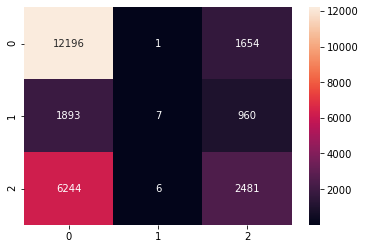

In [139]:
sns.heatmap(cm, annot=True, fmt='g')

# USando XGBoost

In [142]:
classifier = XGBClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)


In [143]:
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy_score(y_test, y_pred)

[[11617    29  2205]
 [ 1707    68  1085]
 [ 5653    67  3011]]


0.5776275450043236